# Notebook 2: Visualization using 2019-06 and 2019-07 data

## Import visualization tool and library and read datset

In [1]:
import folium
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import seaborn as sns
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
import numpy as np
from datetime import datetime
from matplotlib.dates import date2num
import json

import warnings
warnings.filterwarnings("ignore")

yellow_trip = pd.read_feather("../preprocessed_data/yellow_trip_train.feather")
yellow_trip = yellow_trip.iloc[: , 1:]

## Potential factor that affect the profitability 

### 1 What affect the demand of taxi

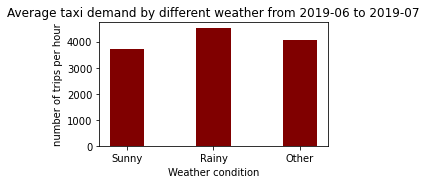

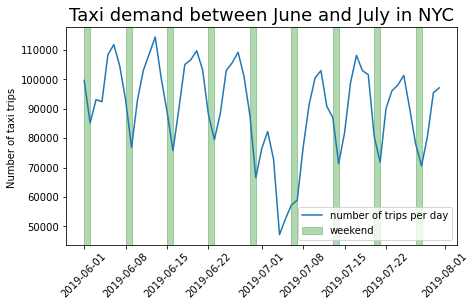

In [15]:
# 1 weather # bar chart

figure = plt.figure(figsize=(9,5))
plt.subplot(221)
# Partition Sunny day , Rain day and Other

sunny = yellow_trip.loc[yellow_trip['weather'] == "Sunny"]
rainy = yellow_trip.loc[yellow_trip['weather'] == "Rain"]
other = yellow_trip.loc[yellow_trip['weather'] == "Other"]

# get number of trips per HOUR in different weather condition
def demand_per_hour(df):
    return len(df)/len(df[['start_date','hour']].drop_duplicates())


weather_condition = ['Sunny','Rainy','Other']
demand = [demand_per_hour(sunny),demand_per_hour(rainy),demand_per_hour(other)]

plt.bar(weather_condition,demand, color ='maroon',
        width = 0.4)
 
plt.xlabel("Weather condition")
plt.ylabel("number of trips per hour")
plt.title("Average taxi demand by different weather from 2019-06 to 2019-07")
plt.show()

figure.savefig('../plots/demand by weather.png')
# 2 Weekday effect



weekday = yellow_trip.loc[yellow_trip['weekday'] == 'Weekday']
weekend = yellow_trip.loc[yellow_trip['weekday'] == 'Weekend']
# temporary set weekend date equals 1 for easy group sum
new_weekday = weekday[['start_date','weekday']].groupby('start_date').count().reset_index()
new_weekend = weekend[['start_date','weekday']].groupby('start_date').count().reset_index()

# combine two dataset and sort by date
df = pd.concat([new_weekday,new_weekend])
df.sort_values(by = ["start_date"],inplace = True)

figure,ax = plt.subplots(figsize=(7,4))
ax.plot(df['start_date'],df['weekday'])
ax.set_ylabel('Taxi trips')
ax.legend(['weekday','weekend'])
ax.set_title('Taxi demand between June and July in NYC', size=18)

weekend_date = new_weekend['start_date']

# Color the weekend 
for i in range(0,len(new_weekend['start_date'])-1,2):  
    ax.axvspan(new_weekend['start_date'][i], new_weekend['start_date'][i+1], label="Weekend period",color="green", alpha=0.3)
    
ax.legend(['number of trips per day','weekend'])
ax.set_ylabel('Number of taxi trips ')
plt.xticks(rotation=45)

figure.savefig('../plots/demand by date.png')

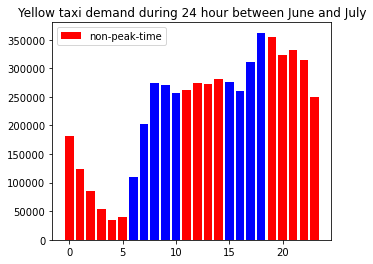

<Figure size 720x360 with 0 Axes>

In [3]:
# Generate color for peak time
color = []
for i in range(24):
    if ((i <=10) & (i>=6)) |((i>=15) &(i<19)):
        color.append('b')
    else:
        color.append('r')
figure = plt.figure(figsize=(5,4)) 

data = (yellow_trip['hour'].value_counts()).sort_index()
plt.bar(range(24),data,color = color )
plt.title("Yellow taxi demand during 24 hour between June and July")
plt.legend(['non-peak-time'])
plt.figure(figsize=(10,5))
plt.show()
figure.savefig('../plots/demand by hour.png')

In [4]:
## 4 Location
## Modified based on ADS Workshop 2 sample code
## NOTE:!!! tip column only shows the number of trips instead of real tip amount


from folium.plugins import FastMarkerCluster
# sf stands for shape file
sf = gpd.read_file("../raw_data/taxi_zones/taxi_zones.shp")
zone = pd.read_csv("../raw_data/taxi_zones/taxi+_zone_lookup.csv")
# Convert the geometry shaape to to latitude and longitude
# Please attribute this if you are using it
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")
gdf = gpd.GeoDataFrame(pd.merge(yellow_trip, sf, left_on='PULocationID', right_on='LocationID')).drop('PULocationID',axis=1)
geoJSON = gdf[['LocationID','geometry']].drop_duplicates('LocationID').to_json()
ngdf = gdf[['LocationID','tip_amount']].groupby('LocationID').count().reset_index()
m_demand = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)


# refer to the folium documentations on more information on how to plot aggregated data.
folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=ngdf, # data source
    columns=['LocationID','tip_amount'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='OrRd', # color scheme
    fill_opacity=0.9,
    line_opacity=0.5,
    legend_name='Trips' # legend title
).add_to(m_demand)


folium.Marker(
    location = [40.75530,-73.97534 ],
    popup = "Most busiest district",
    icon = folium.Icon(color = "green"),
).add_to(m_demand)

m_demand.save('../plots/demand Of destrict.html')
m_demand

In [5]:
## Top 5 highest demand of the districts
df = ngdf.sort_values("tip_amount",ascending = False).head(1)
gpd.GeoDataFrame(pd.merge(df, sf, left_on='LocationID', right_on='LocationID'))

,LocationID,tip_amount,OBJECTID,Shape_Leng,Shape_Area,zone,borough,geometry
0,161,232772,161,0.035804,0.000072,Midtown Center,Manhattan,"POLYGON ((-73.97534 40.75530, -73.97581 40.754..."


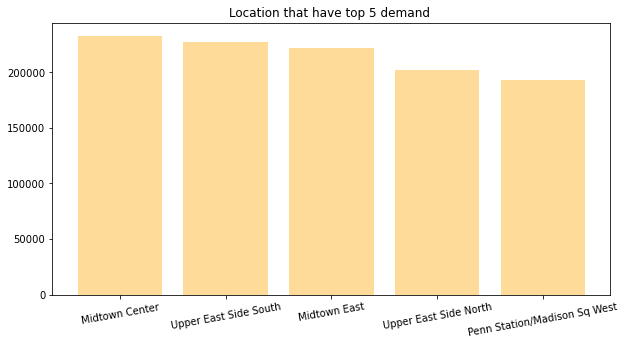

<Figure size 720x360 with 0 Axes>

In [6]:
figure = plt.figure(figsize=(10,5))
df_3 = ngdf.sort_values("tip_amount",ascending = False).head(5)
df_3 = pd.merge(df_3, sf, left_on='LocationID', right_on='LocationID')
plt.bar(df_3['zone'],df_3['tip_amount'],color = "orange",alpha = 0.4)
plt.title("Location that have top 5 demand ")
plt.xticks(rotation = 10)
plt.figure(figsize=(10,5))
figure.savefig("../plots/Location that have top 5 demand.png")
plt.show()

## 2 What will affect the tip amount ?

### Tip amount VS 4 factors

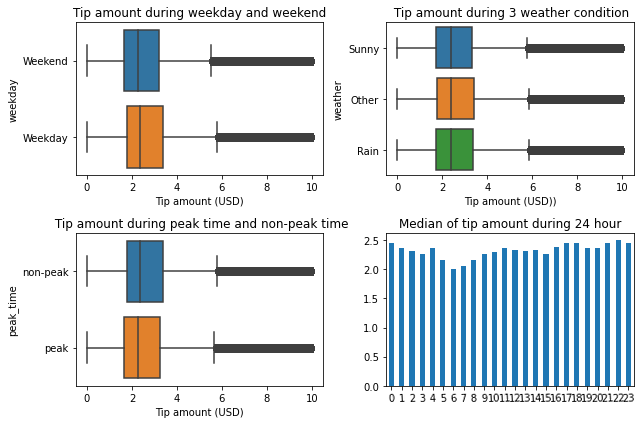

In [7]:
figure = plt.figure(figsize=(9,6))
plt.subplot(221)
sns.boxplot(x= 'tip_amount', y = 'weekday' ,data= yellow_trip)
plt.title("Tip amount during weekday and weekend")
plt.xlabel('Tip amount (USD)')
plt.tight_layout()

plt.subplot(222)
sns.boxplot(x= 'tip_amount', y = 'weather' ,data= yellow_trip)
plt.title(" Tip amount during 3 weather condition")
plt.xlabel('Tip amount (USD))')
plt.tight_layout()
figure.savefig('../plots/Income vs 4 features.png')

plt.subplot(223)
sns.boxplot(x= 'tip_amount', y = 'peak_time' ,data= yellow_trip)
plt.title(" Tip amount during peak time and non-peak time")
plt.xlabel('Tip amount (USD)')
plt.tight_layout()

plt.subplot(224)
(yellow_trip[['hour','tip_amount']].groupby('hour').median().reset_index()['tip_amount']).plot.bar(range(24),rot = 3)
plt.title("Median of tip amount during 24 hour")

figure.savefig('../plots/Tip amount vs 4 features.png')

### Correlation

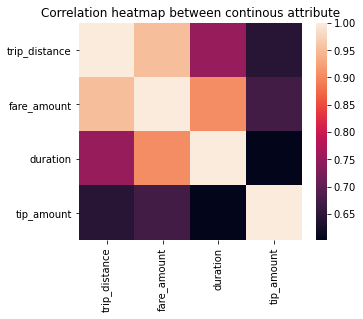

In [8]:
figure = plt.figure(figsize=(5,4))
CORR_COLS = ["trip_distance", "fare_amount","duration","tip_amount"]
sns.heatmap(yellow_trip[CORR_COLS].corr()).set(title = "Correlation heatmap between continous attribute")
plt.show()
figure.savefig('../plots/correlation between continous attribtues.png')

### Geospatial visualization of median of income

In [9]:
## Modified based on ADS Workshop 2 sample code


salary_df = gdf[['LocationID','tip_amount']].groupby('LocationID').median().reset_index()
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

sf = gpd.read_file("../raw_data/taxi_zones/taxi_zones.shp")
zone = pd.read_csv("../raw_data/taxi_zones/taxi+_zone_lookup.csv")
# Convert the geometry shaape to to latitude and longitude
sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")
salary_gdf = gpd.GeoDataFrame(pd.merge(salary_df, sf, left_on='LocationID', right_on='LocationID'))
geoJSON = salary_gdf[['LocationID','geometry']].drop_duplicates('LocationID').to_json()
m_salary = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data = salary_gdf, # data source
    columns=['LocationID','tip_amount'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_opacity=1,
    line_opacity=0.3,
    legend_name='Median of Income USD/h' # legend title
).add_to(m_salary)


folium.Marker(
    location = [40.61523,-73.82076],
    popup = "District has highest median salary",
    icon = folium.Icon(color = "red"),
).add_to(m_salary)


m_salary.save('../plots/medianSalary.html')
m_salary

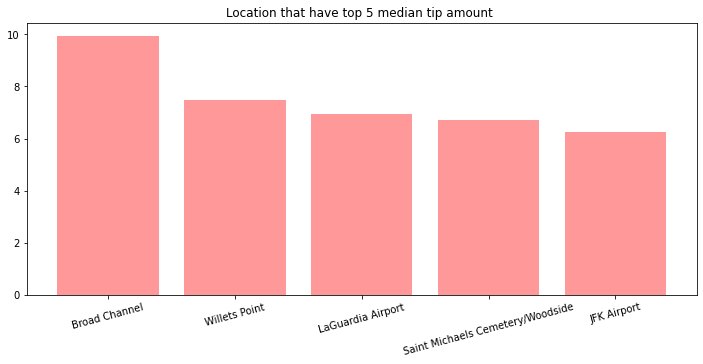

<Figure size 720x360 with 0 Axes>

In [10]:
## Top 5 location that have highest median income 
figure = plt.figure(figsize=(12,5))
salary_df['LocationID'] = salary_df['LocationID'].astype(object)
df_3 = pd.merge(salary_df.sort_values(by= "tip_amount",ascending = False).head(5), sf, left_on='LocationID', right_on='LocationID')
plt.bar(df_3['zone'],df_3['tip_amount'],color = "red",alpha = 0.4)
plt.title("Location that have top 5 median tip amount ")
plt.xticks(rotation = 15)
plt.figure(figsize=(10,5))
figure.savefig("../plots/Location that have top 5 median tip.png")
plt.show()

In [11]:
## Get highest median district location ID
df = salary_df.sort_values("tip_amount",ascending = False).head(1)
gpd.GeoDataFrame(pd.merge(df, sf, left_on='LocationID', right_on='LocationID'))['geometry']
df

,LocationID,tip_amount
29,30,9.95


In [12]:
# Coordinate of location that have highest median of income
gpd.GeoDataFrame(pd.merge(df, sf, left_on='LocationID', right_on='LocationID'))

,LocationID,tip_amount,OBJECTID,Shape_Leng,Shape_Area,zone,borough,geometry
0,30,9.95,30,0.09451,0.000146,Broad Channel,Queens,"POLYGON ((-73.82076 40.61523, -73.81769 40.614..."
